In [3]:
import pandas as pd
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
from stop_words import STOP_WORDS

pd.set_option('display.max_colwidth', 50)

In [4]:
df = pd.read_csv('../data/climate_news_3y.tar.bz2', low_memory = False)
df['published_date'] = pd.to_datetime(df['published_date'])

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63397 entries, 0 to 63396
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   title                     63397 non-null  object        
 1   author                    51466 non-null  object        
 2   published_date            63397 non-null  datetime64[ns]
 3   published_date_precision  63353 non-null  object        
 4   link                      63397 non-null  object        
 5   clean_url                 63397 non-null  object        
 6   excerpt                   62247 non-null  object        
 7   summary                   63396 non-null  object        
 8   rights                    62650 non-null  object        
 9   rank                      63397 non-null  int64         
 10  topic                     63397 non-null  object        
 11  country                   63397 non-null  object        
 12  language          

In [54]:
# Data cleaning 
# Removing duplicates, irrelevant articles
# and rows without summaries

df.drop_duplicates(subset = ['summary'], inplace = True)
df = df.query(" _score > 15")

mask = df['summary'].notna()
df = df[mask]

df.shape

(14730, 19)

In [55]:
news_list = df['summary'].to_list()
timestamps = df['published_date'].dt.strftime('%Y-%m-%d').to_list()

In [56]:
vectorizer_model = CountVectorizer(stop_words = list(STOP_WORDS))

sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(news_list, show_progress_bar=True)

umap = UMAP(random_state = 1)
topic_model = BERTopic(nr_topics = 100, vectorizer_model = vectorizer_model,  
                       umap_model = umap, min_topic_size = 100, verbose = True).fit(news_list, embeddings)

Batches: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 461/461 [01:34<00:00,  4.86it/s]
2023-05-29 03:14:38,086 - BERTopic - Reduced dimensionality
2023-05-29 03:14:38,537 - BERTopic - Clustered reduced embeddings
2023-05-29 03:14:49,847 - BERTopic - Reduced number of topics from 23 to 23


In [57]:
topic_model.get_topic_info().sort_values('Count', ascending = False)

,Topic,Count,Name
0,-1,6801,-1_climate_said_change_global
7,6,2001,6_biden_climate_said_president
4,3,716,3_food_people_said_farmers
22,21,526,21_government_uk_green_climate
13,12,512,12_australia_government_australian_emissions
15,14,499,14_climate_change_people_world
10,9,470,9_species_biodiversity_trees_nature
6,5,379,5_china_climate_chinese_chinas
14,13,301,13_pandemic_world_countries_global
21,20,283,20_countries_climate_cop26_emissions


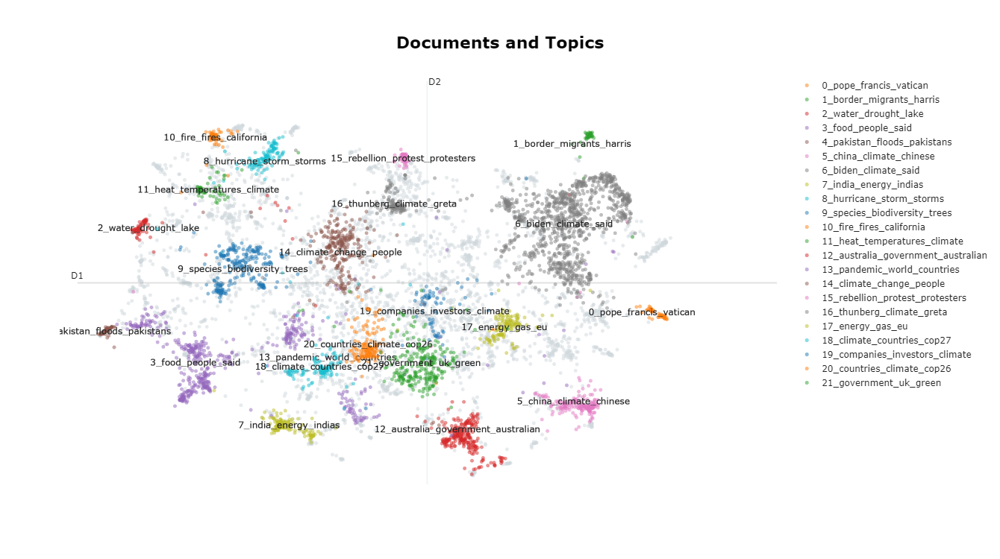

In [58]:
news_wrap = (df['summary'].str[:800].str.wrap(50)
             .apply(lambda x: x.replace('\n', '<br>')).to_list())

umap = UMAP(n_neighbors=50, n_components=2, min_dist=0.0,
            metric='euclidean', random_state = 1)

reduced_embeddings = umap.fit_transform(embeddings)

fig = topic_model.visualize_documents(news_wrap, topics = list(range(50)), 
                                     # width = 1920, height = 1080,
                                      reduced_embeddings = reduced_embeddings, sample = .5)
fig.show()

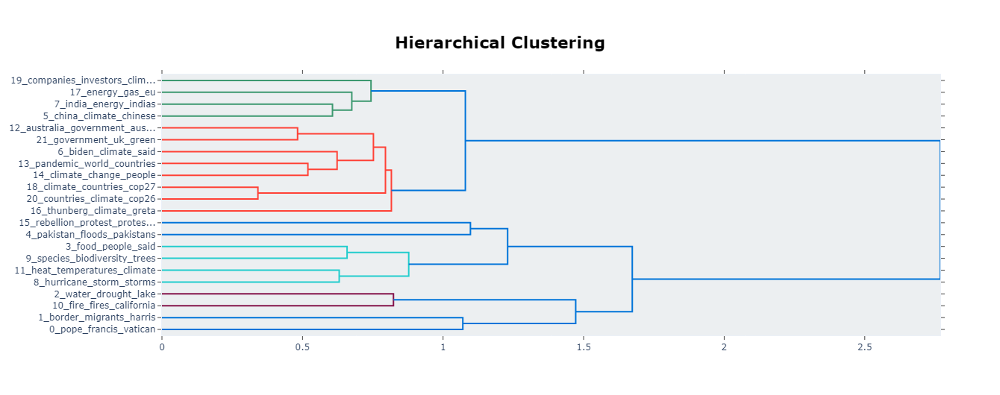

In [59]:
topic_model.visualize_hierarchy()

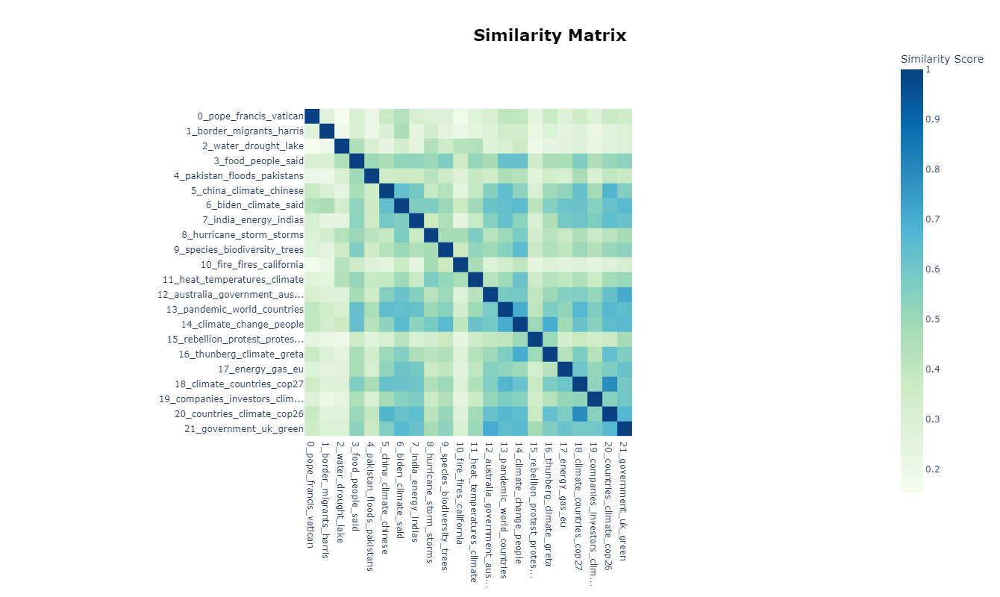

In [60]:
topic_model.visualize_heatmap()
